### Ablation study: Loss $\mathcal L_\mathrm{geo} + \mathcal L_\mathrm{acc}$, dataset $\mathcal S$

In [1]:
import multiprocessing as mp
import numpy as np

In [2]:
def objective_process(result_queue):
    import matplotlib.pyplot as plt
    import tensorflow as tf
    import numpy as np
    
    import DissimilarityMetrics
    import ChannelChartingCore
    import Evaluation

    import dichasus_cf0x

    print("Loading Dataset...")
    groundtruth_positions = []
    csi_time_domain = []
    timestamps = []
    
    for csi, pos, time in dichasus_cf0x.trainingset.batch(1000):
        csi_time_domain.append(csi.numpy())
        groundtruth_positions.append(pos.numpy())
        timestamps.append(time.numpy())
    
    csi_time_domain = np.concatenate(csi_time_domain)
    groundtruth_positions = np.concatenate(groundtruth_positions)
    timestamps = np.concatenate(timestamps)
    
    MEASUREMENT_INTERVAL = 0.048
    timestamps = timestamps - timestamps[0]
    timestamps = np.round(timestamps / MEASUREMENT_INTERVAL) * MEASUREMENT_INTERVAL

    Evaluation.plot_colorized(groundtruth_positions, groundtruth_positions, title="Ground Truth Positions")

    @tf.function
    def compute_adp_dissimilarity_matrix(csi_array):
        output = tf.TensorArray(tf.float32, size = csi_array.shape[0])
    
        powers = tf.einsum("lbrmt,lbrmt->lbt", csi_array, tf.math.conj(csi_array))
        for i in tf.range(csi_array.shape[0]):
            w = csi_array[i:,:,:,:]
            h = csi_array[i,:,:,:]
    
            dotproducts = tf.abs(tf.square(tf.einsum("brmt,lbrmt->lbt", tf.math.conj(h), w)))
            d_new = tf.math.reduce_sum(1 - dotproducts / tf.math.real(powers[i] * powers[i:]), axis = (1, 2))
            d = tf.concat([tf.zeros(i), tf.maximum(d_new, 0)], 0)
    
            output = output.write(i, d)
    
        dissim_upper_tri = output.stack()
        return dissim_upper_tri + tf.transpose(dissim_upper_tri)
    
    adp_dissimilarity_matrix = compute_adp_dissimilarity_matrix(csi_time_domain).numpy()

    # Ablation study: Edge weights are now deterministic, based on existing code from [dissimilarity-metric based Channel Charting tutorial](https://dichasus.inue.uni-stuttgart.de/tutorials/tutorial/dissimilarity-metric-channelcharting/).

    # Compute timestamp-based dissimilarity matrix
    timestamp_dissimilarity_matrix = np.abs(np.subtract.outer(timestamps, timestamps))

    TIME_THRESHOLD = 2
    small_time_dissimilarity_indices = np.logical_and(timestamp_dissimilarity_matrix < TIME_THRESHOLD, timestamp_dissimilarity_matrix > 0)
    small_time_dissimilarities = timestamp_dissimilarity_matrix[small_time_dissimilarity_indices]
    small_adp_dissimilarities = adp_dissimilarity_matrix[small_time_dissimilarity_indices]
    
    n_bins = 1500
    
    fig, ax1 = plt.subplots()
    occurences, edges, patches = ax1.hist(small_adp_dissimilarities / small_time_dissimilarities, range = (0, 50), bins = n_bins)
    ax1.set_xlabel("$D_\mathrm{APDP} / D_\mathrm{time}$")
    ax1.set_ylabel("Number of Occurences")

    bin_centers = edges[:-1] + np.diff(edges) / 2.
    max_bin = np.argmax(occurences)
    min_threshold = np.quantile(occurences[:max_bin], 0.5)
    
    for threshold_bin in range(max_bin - 1, -1, -1):
        if occurences[threshold_bin] < min_threshold:
            break
    
    scaling_factor = bin_centers[threshold_bin]
    
    plt.bar(bin_centers[:max_bin], occurences[:max_bin], width = edges[1] - edges[0])
    plt.axhline(y = min_threshold, color = 'r', linestyle = '-')
    plt.text(4, min_threshold + 10, "Mode Separation Threshold", color = 'r',)
    plt.axvline(x = scaling_factor, color = 'r', linestyle = '-')
    plt.xlabel("$D_\mathrm{APDP} / D_\mathrm{time}$")
    plt.ylabel("Number of Occurences")
    plt.show()
    
    print("gamma = ", scaling_factor)

    # Fuse ADP-based and time-based dissimilarity matrices
    dissimilarity_matrix_fused = np.minimum(adp_dissimilarity_matrix, timestamp_dissimilarity_matrix * scaling_factor)

    class DeterministicDissimilarityMetric(DissimilarityMetrics.GaussianDissimilarityMetric):
        def __init__(self, dissimilarity_matrix, beta):
            self.dissimilarity_matrix = dissimilarity_matrix
            self.beta = beta
        
        def get_realization(self, output_matrix, variance_scale):
            output_matrix[:] = self.dissimilarity_matrix
    
        def mean_variance_along_path(self, paths, mask):
            dissimilarities = self.dissimilarity_matrix[paths[:,:-1], paths[:,1:]]
            dissimilarities_sum = np.sum(np.where(mask, dissimilarities, 0), axis = 1)
    
            return dissimilarities_sum, (dissimilarities_sum + self.beta) / 2
        
        def get_datapoint_count(self):
            return self.dissimilarity_matrix.shape[0]
    
        def is_contractable(self):
            return False
    
    beta = np.quantile(dissimilarity_matrix_fused, 0.01)
    dissimilarity_metric = DeterministicDissimilarityMetric(dissimilarity_matrix_fused, beta)

    GDM = ChannelChartingCore.GaussianDissimilarityModel([dissimilarity_metric])
    GDM.generate_short_paths(total_path_count = 40000, realization_count = 1)

    MIN_BATCH_SIZE = 500
    MAX_BATCH_SIZE = 4000
    LEARNING_RATE_INITIAL = 1.5e-2
    LEARNING_RATE_FINAL = 1e-2
    MAX_HOPLENGTH = 1500.0
    MIN_HOPLENGTH = 7.0
    MAX_PATHHOPS = 50
    TRAINING_BATCHES = 3000
    ACCELERATION_MEAN = 0.0
    ACCELERATION_VARIANCE = 0.5
    ACCELERATION_WEIGHT = 1e-4
    
    plot_callback = None # Evaluation.PlotChartCallback(groundtruth_positions, csi_time_domain.shape[0], max_hops = MAX_PATHHOPS)
    cc = ChannelChartingCore.ChannelChart(GDM, csi_time_domain, timestamps, min_batch_size = MIN_BATCH_SIZE, max_batch_size = MAX_BATCH_SIZE, learning_rate_initial = LEARNING_RATE_INITIAL, learning_rate_final = LEARNING_RATE_FINAL, max_hoplength = MAX_HOPLENGTH, min_hoplength = MIN_HOPLENGTH, randomize_pathhops = False, training_batches = TRAINING_BATCHES, plot_callback = plot_callback, acceleration_mean = ACCELERATION_MEAN, acceleration_variance = ACCELERATION_VARIANCE, acceleration_weight = ACCELERATION_WEIGHT, max_pathhops = MAX_PATHHOPS)

    channel_chart_positions = cc.predict(csi_time_domain)
    ct, tw, ks = Evaluation.ct_tw_ks_on_subset(groundtruth_positions, channel_chart_positions)
    print(f"CT: {ct:.4f}\nTW: {tw:.4f}\nKS: {ks:.4f}")

    channel_chart_positions_transformed, errorvectors, errors, mae, cep = Evaluation.mean_absolute_error_transformed(groundtruth_positions, channel_chart_positions)
    Evaluation.plot_colorized(channel_chart_positions_transformed, groundtruth_positions, title = "CC After Affine Transform")

    print(f"MAE: {mae:.4f}\nCEP: {cep:.4f}")
    
    result_queue.put((mae, cep))

In [3]:
maes = []
ceps = []

result_queue = mp.Queue()

2024-12-03 09:55:58.392358: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 09:55:59.181826: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 09:56:00.438626: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 09:56:00.492831: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 09:56:27.916077: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


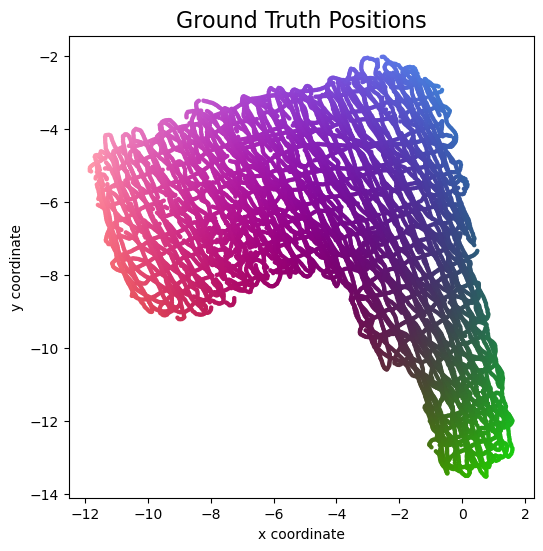

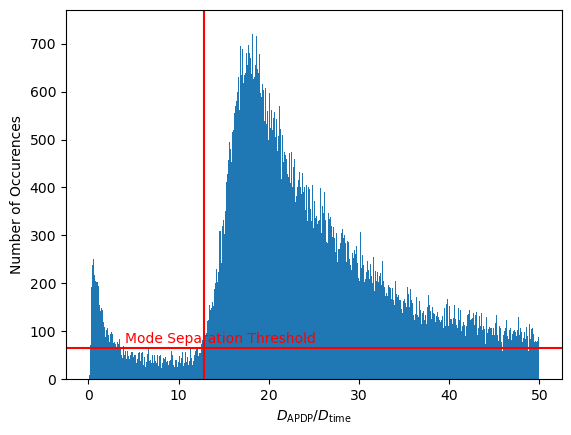

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733219962.118152  497983 service.cc:145] XLA service 0x79da242565f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733219962.118194  497983 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 09:59:22.220446: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 09:59:22.560279: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 09:59:23.522919: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:38 33ms/step - loss: 512.9320

I0000 00:00:1733219964.947895  497983 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 42.5999
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9972
TW: 0.9965
KS: 0.0815


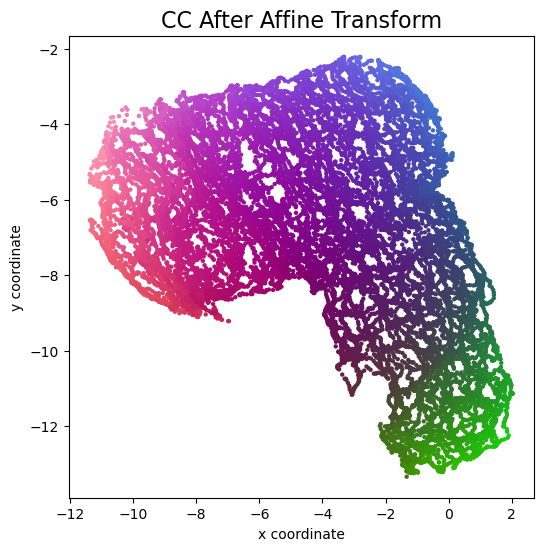

MAE: 0.3592
CEP: 0.3310


2024-12-03 10:01:42.175316: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:01:42.985310: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:01:44.288215: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:01:44.343605: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:02:16.901880: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


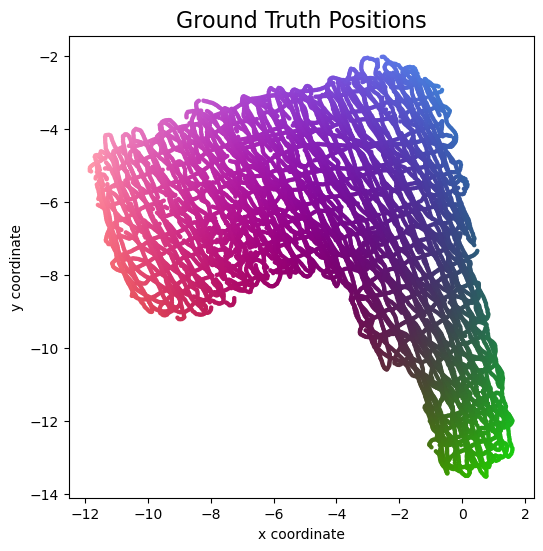

2024-12-03 10:02:27.108905: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 1739056804 exceeds 10% of free system memory.


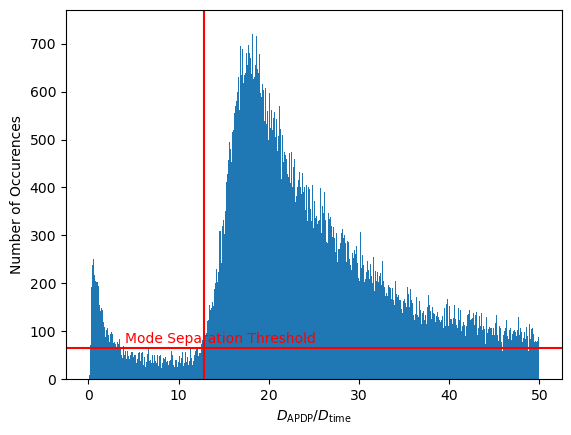

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733220336.407579  506370 service.cc:145] XLA service 0x79da2819e5c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733220336.407614  506370 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:05:36.513570: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:05:36.910875: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:05:37.995184: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:39 33ms/step - loss: 514.7408

I0000 00:00:1733220339.805089  506370 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 144s 46ms/step - loss: 43.9299
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9976
TW: 0.9973
KS: 0.0781


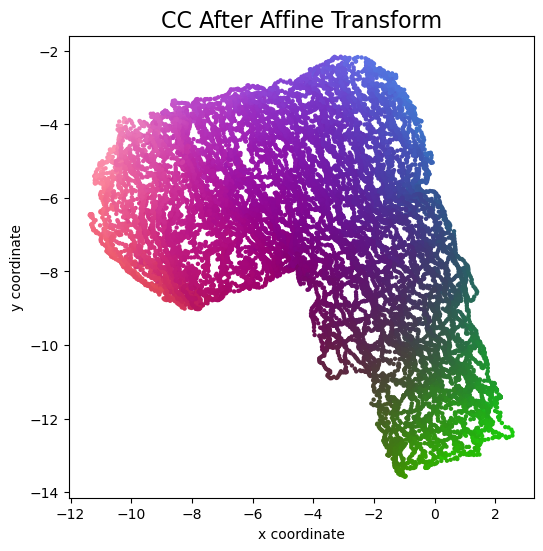

MAE: 0.3233
CEP: 0.2937


2024-12-03 10:08:03.254168: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:08:04.343472: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:08:06.078301: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:08:06.140049: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:08:49.709544: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


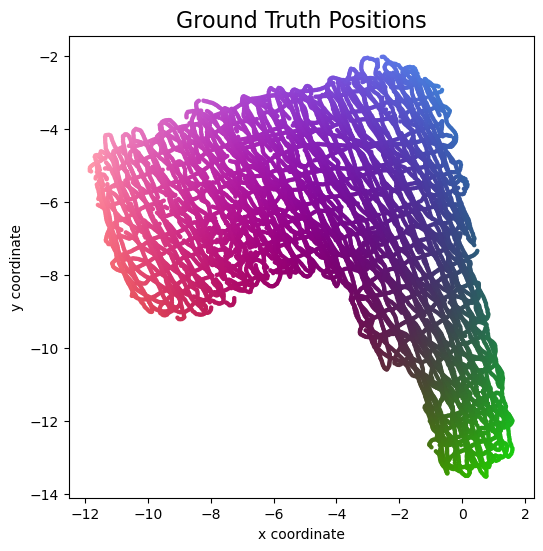

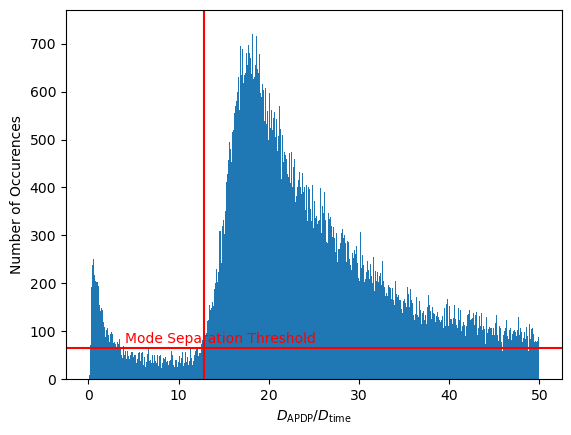

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733220701.699255  515217 service.cc:145] XLA service 0x79da48105530 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733220701.699288  515217 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:11:41.793751: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:11:42.125293: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:11:43.085700: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:38 33ms/step - loss: 512.3309

I0000 00:00:1733220704.515969  515217 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 40.6762
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
CT: 0.9976
TW: 0.9973
KS: 0.0690


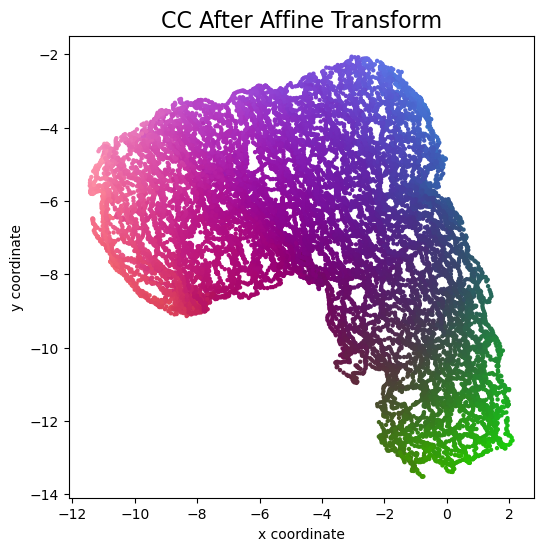

MAE: 0.3252
CEP: 0.3008


2024-12-03 10:14:01.726593: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:14:02.511607: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:14:03.727210: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:14:03.779428: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:14:59.600629: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


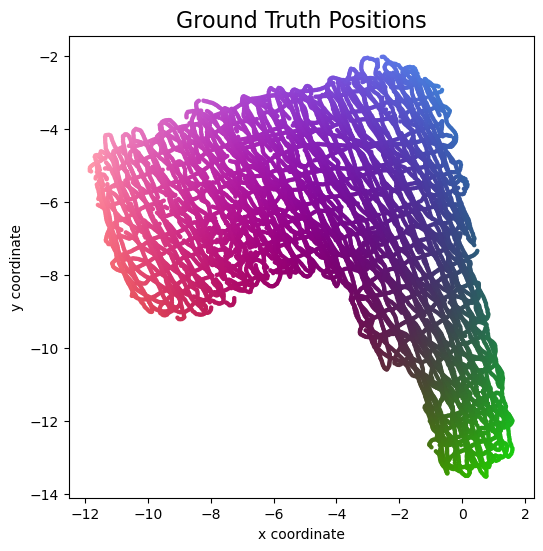

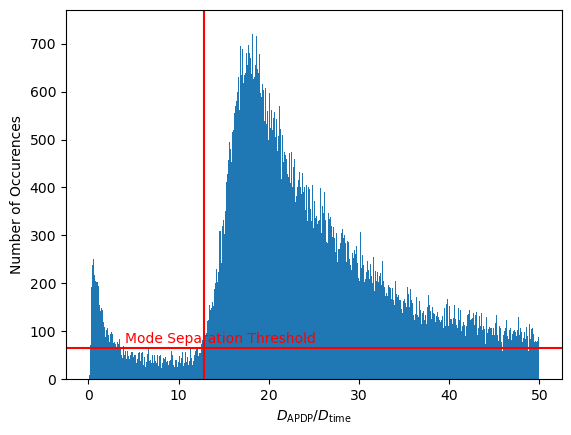

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733221066.079718  523574 service.cc:145] XLA service 0x79da381ae5d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733221066.079876  523574 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:17:46.187712: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:17:46.535718: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:17:47.472019: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:39 33ms/step - loss: 514.7888

I0000 00:00:1733221068.903212  523574 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 41.0613
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9975
TW: 0.9970
KS: 0.0791


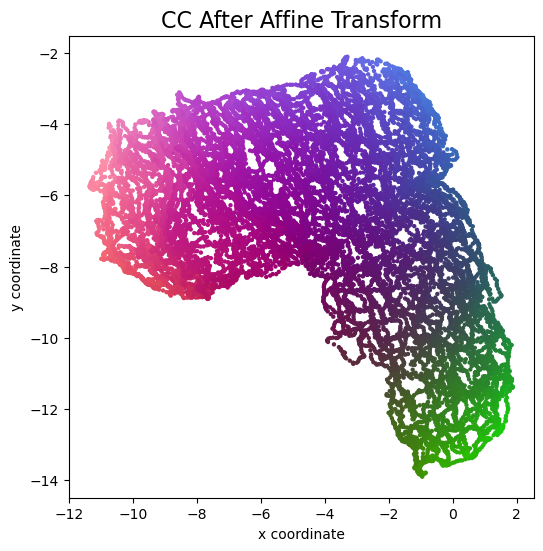

MAE: 0.3222
CEP: 0.2938


2024-12-03 10:20:05.888811: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:20:06.784983: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:20:08.264810: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:20:08.324285: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:20:53.678394: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


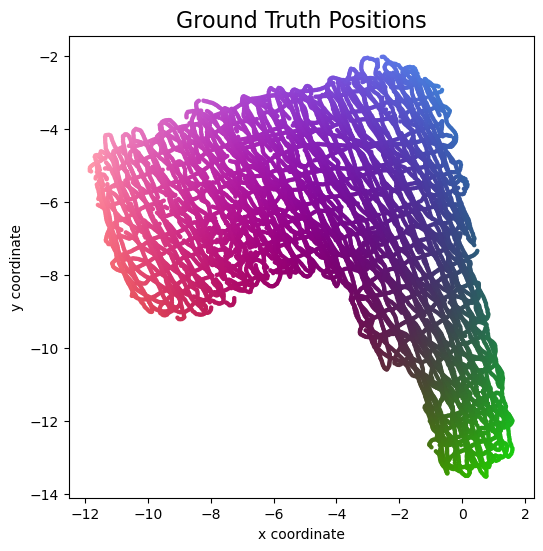

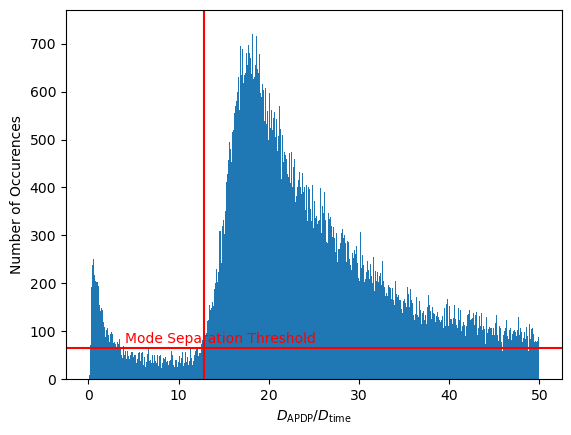

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733221413.989303  531851 service.cc:145] XLA service 0x79da241c13d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733221413.989339  531851 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:23:34.094671: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:23:34.428345: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:23:35.387709: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:37 33ms/step - loss: 512.4879

I0000 00:00:1733221416.817594  531851 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 41.8951
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9976
TW: 0.9975
KS: 0.0758


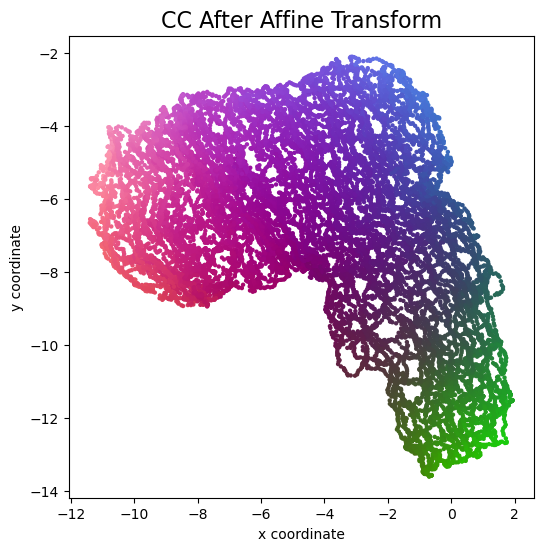

MAE: 0.2998
CEP: 0.2702


2024-12-03 10:25:53.625866: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:25:54.428217: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:25:55.667913: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:25:55.723621: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:26:30.991210: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


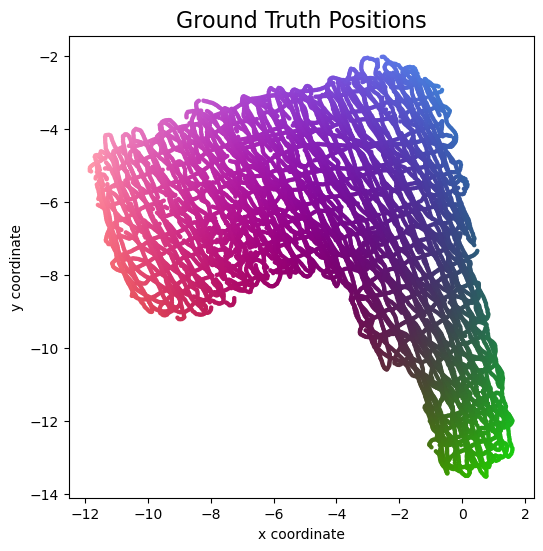

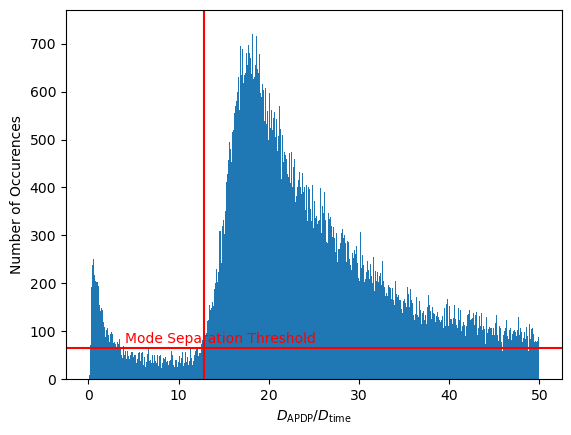

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733221752.719698  540116 service.cc:145] XLA service 0x79da4c223560 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733221752.719763  540116 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:29:12.842236: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:29:13.171059: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:29:14.082820: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:36 32ms/step - loss: 514.3829

I0000 00:00:1733221755.507577  540116 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 41.7921
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
CT: 0.9977
TW: 0.9974
KS: 0.0663


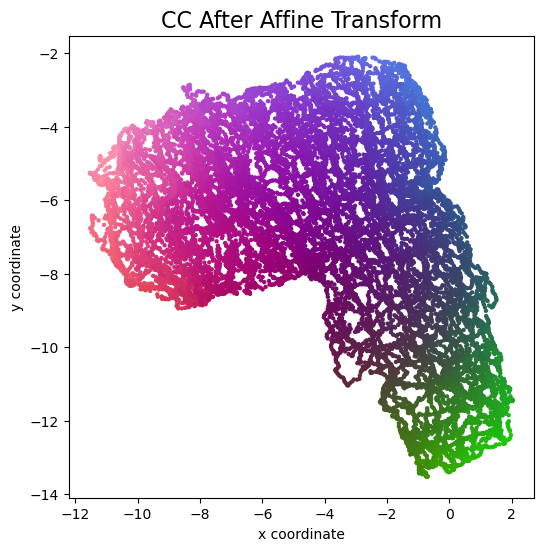

MAE: 0.2975
CEP: 0.2652


2024-12-03 10:31:32.620489: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:31:33.417255: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:31:34.671864: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:31:34.724817: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:32:04.661081: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


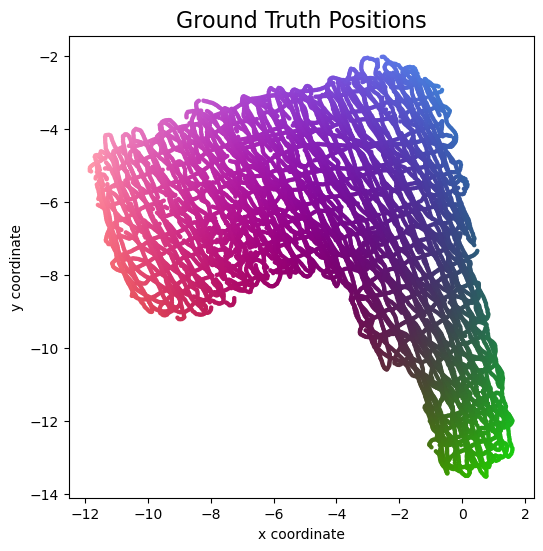

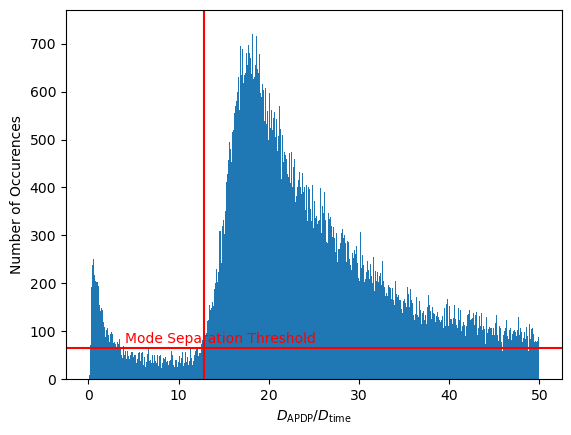

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733222076.337079  548402 service.cc:145] XLA service 0x79da1aaca5b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733222076.337118  548402 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:34:36.425313: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:34:36.755835: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:34:37.709426: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:39 33ms/step - loss: 516.2108

I0000 00:00:1733222079.130275  548402 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 42.2673
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9975
TW: 0.9971
KS: 0.0764


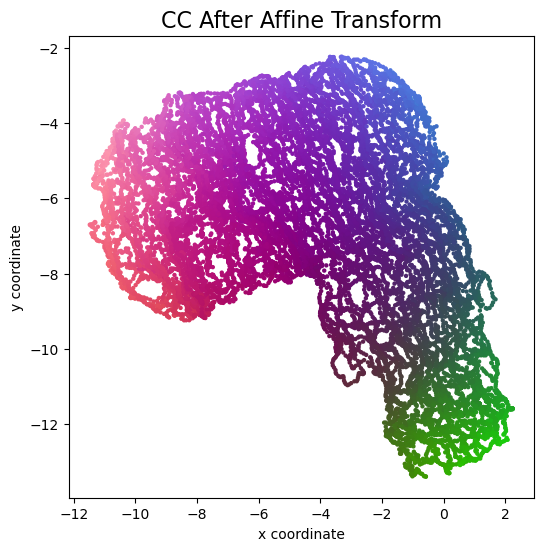

MAE: 0.3066
CEP: 0.2793


2024-12-03 10:36:55.810728: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:36:56.591629: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:36:57.828922: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:36:57.883692: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:37:27.847224: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


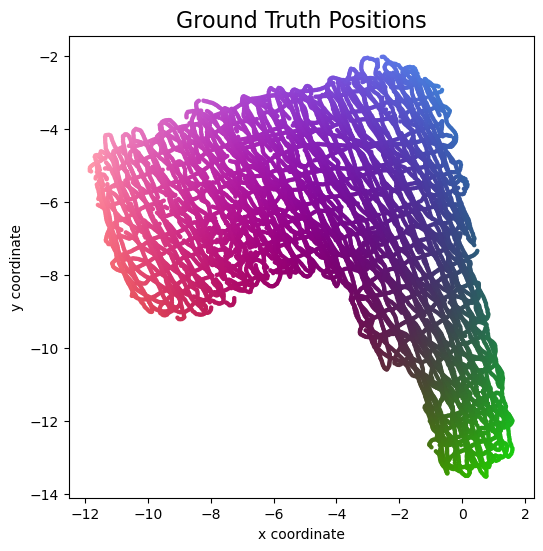

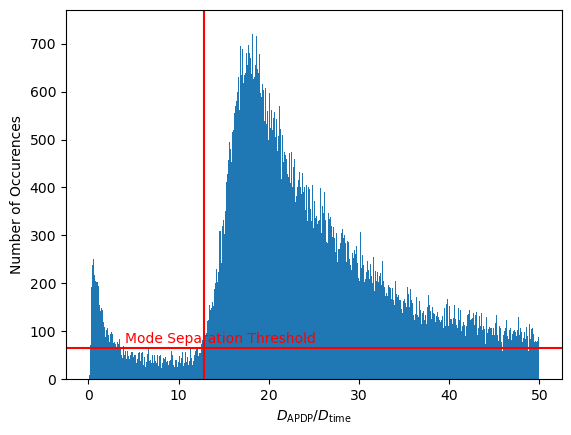

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733222397.572470  556724 service.cc:145] XLA service 0x79da3411dc70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733222397.572510  556724 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:39:57.682882: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:39:58.014259: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:39:58.975377: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:40 34ms/step - loss: 516.5657

I0000 00:00:1733222400.395120  556724 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 41.1831
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9974
TW: 0.9972
KS: 0.0818


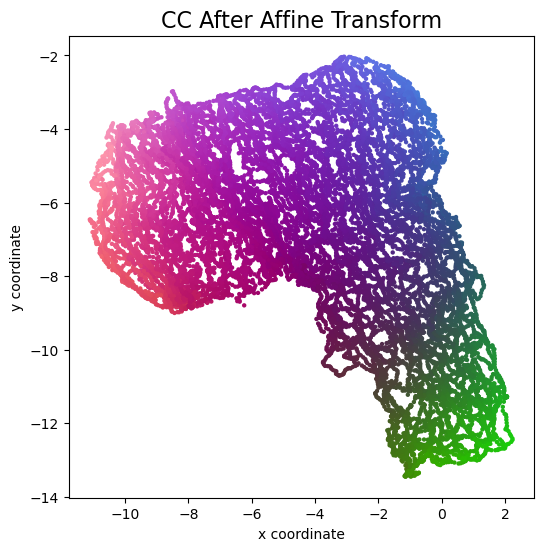

MAE: 0.3437
CEP: 0.3246


2024-12-03 10:42:17.485348: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:42:18.268133: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:42:19.495876: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:42:19.548674: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:42:48.874990: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


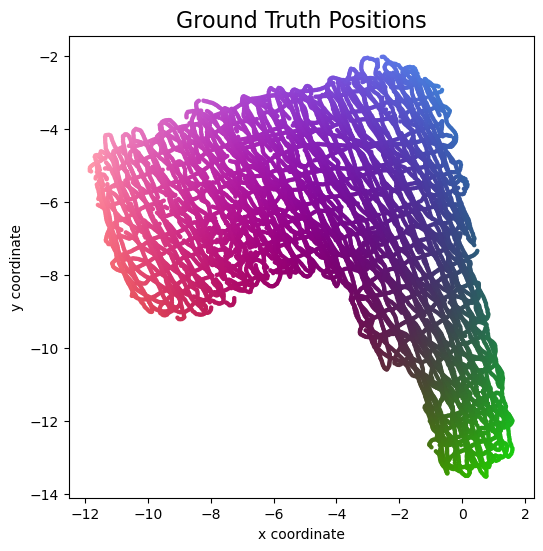

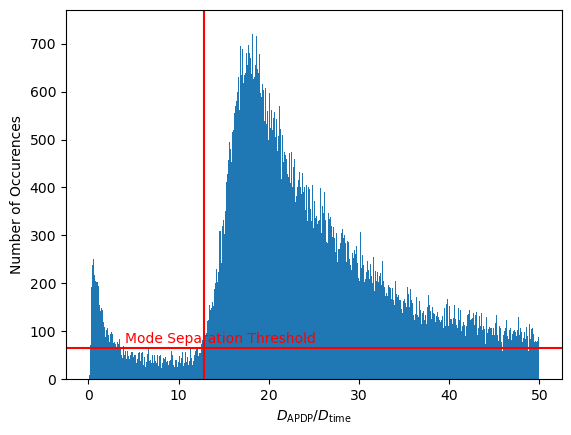

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733222720.691869  565062 service.cc:145] XLA service 0x79da1ab605e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733222720.691929  565062 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:45:20.813658: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:45:21.151973: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:45:22.113905: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:37 33ms/step - loss: 514.6765

I0000 00:00:1733222723.534244  565062 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 41.0001
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
CT: 0.9976
TW: 0.9973
KS: 0.0732


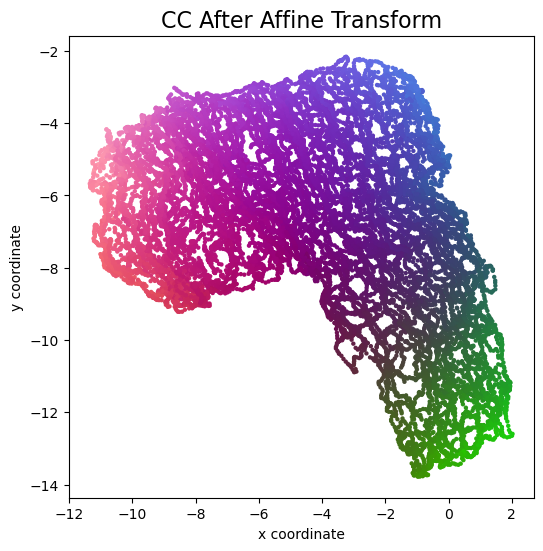

MAE: 0.3266
CEP: 0.3022


2024-12-03 10:47:40.782770: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:47:41.595054: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:47:42.907663: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:47:42.963408: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:48:20.461887: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


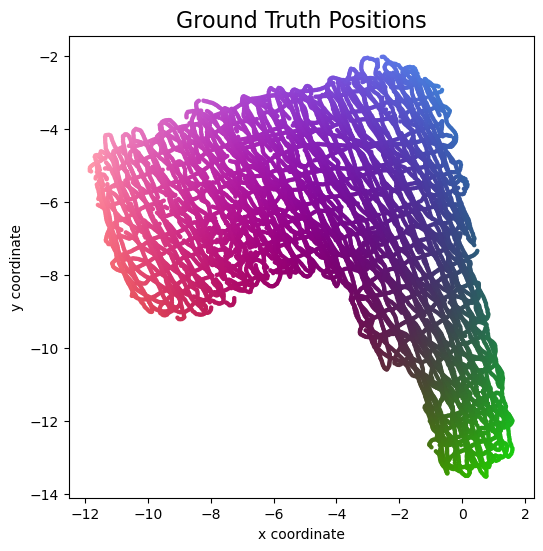

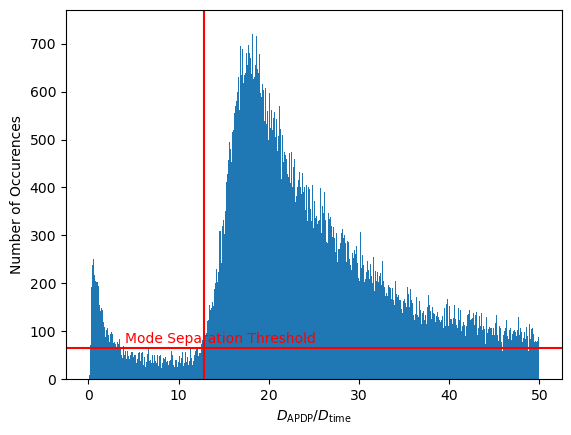

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733223050.036567  573415 service.cc:145] XLA service 0x79da28193b20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733223050.036625  573415 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:50:50.159978: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:50:50.498726: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:50:51.440472: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:40 33ms/step - loss: 515.6398

I0000 00:00:1733223052.864363  573415 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 138s 44ms/step - loss: 41.0681
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9975
TW: 0.9971
KS: 0.0773


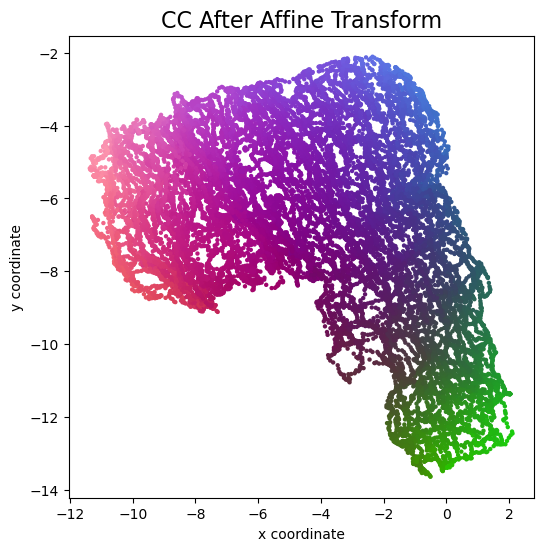

MAE: 0.3262
CEP: 0.3035


2024-12-03 10:53:10.772650: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:53:11.575191: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:53:13.078670: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:53:13.139465: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:53:45.001240: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


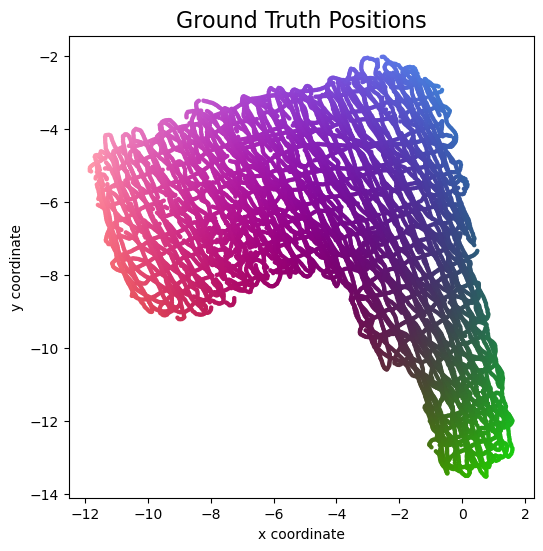

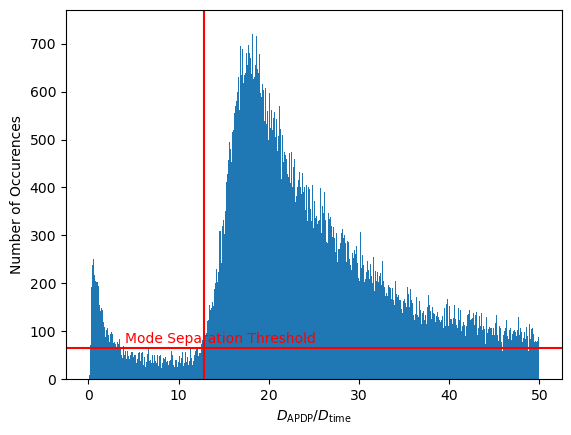

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733223397.580675  581787 service.cc:145] XLA service 0x79da3c224210 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733223397.580730  581787 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 10:56:37.704727: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 10:56:38.035973: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 10:56:38.972869: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:34 32ms/step - loss: 514.1025

I0000 00:00:1733223400.394750  581787 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 40.9746
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
CT: 0.9976
TW: 0.9971
KS: 0.0801


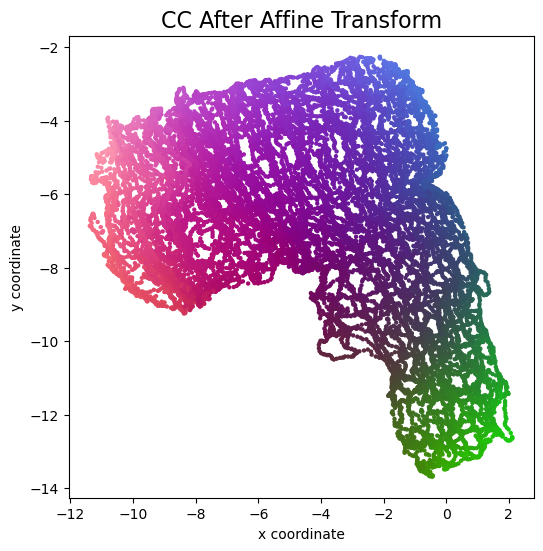

MAE: 0.3201
CEP: 0.2978


2024-12-03 10:58:57.478157: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 10:58:58.272795: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 10:58:59.529705: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 10:58:59.583466: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 10:59:28.977490: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


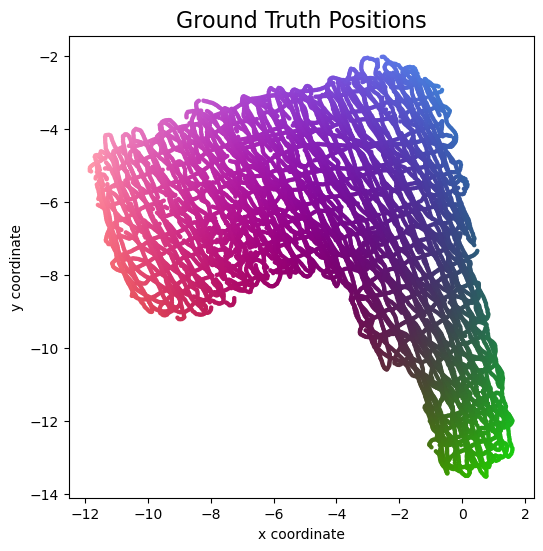

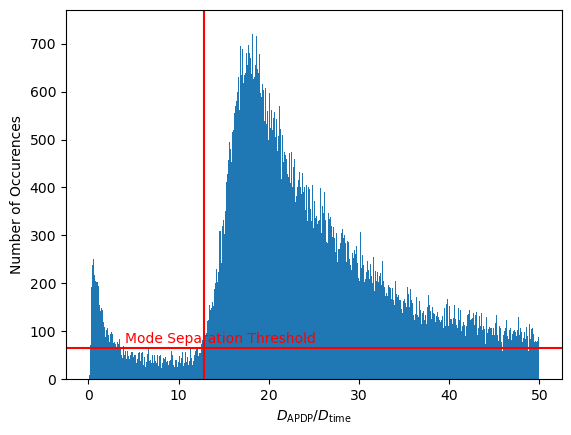

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733223716.723748  590518 service.cc:145] XLA service 0x79da34244cf0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733223716.723787  590518 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:01:56.839658: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:01:57.178185: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:01:58.091843: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:37 33ms/step - loss: 515.5642

I0000 00:00:1733223719.523491  590518 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 40.8684
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
CT: 0.9976
TW: 0.9973
KS: 0.0726


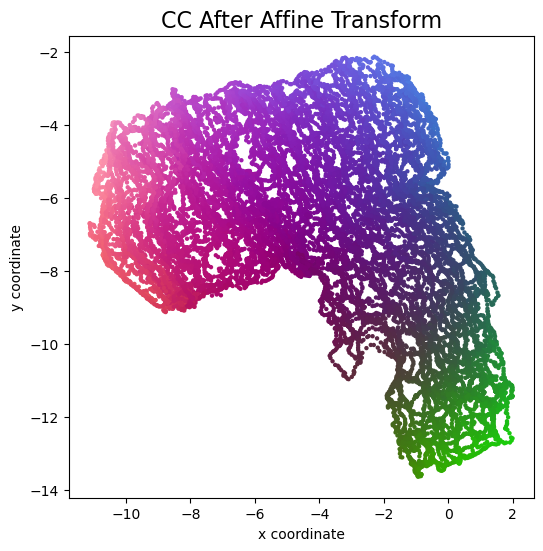

MAE: 0.3176
CEP: 0.2954


2024-12-03 11:04:16.434909: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 11:04:17.230036: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 11:04:18.514901: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 11:04:18.571242: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 11:04:49.613817: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


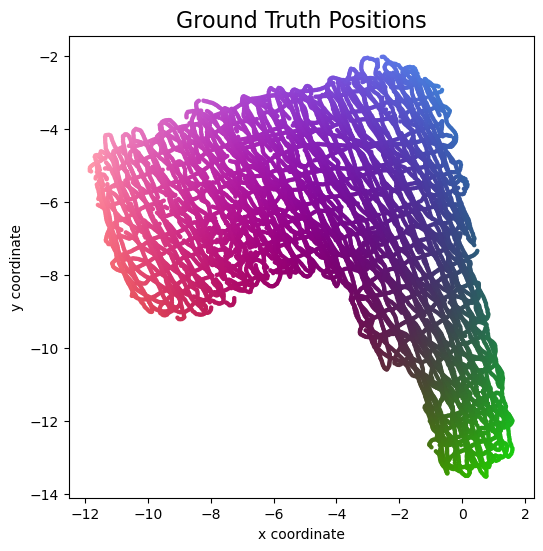

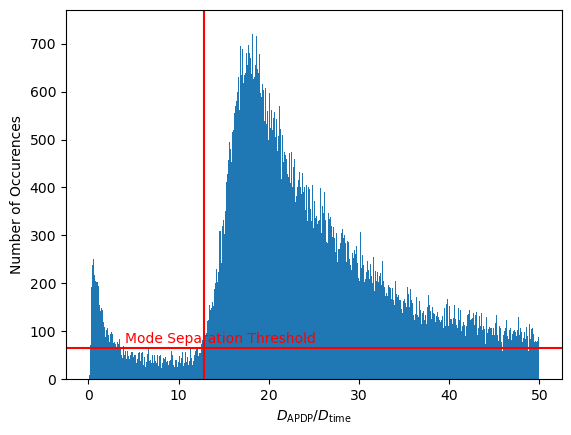

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733224036.631529  598766 service.cc:145] XLA service 0x79da4c19f0a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733224036.631566  598766 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:07:16.728037: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:07:17.055553: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:07:17.995877: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:39 33ms/step - loss: 516.0423

I0000 00:00:1733224039.435929  598766 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 42.7199
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
CT: 0.9973
TW: 0.9970
KS: 0.0820


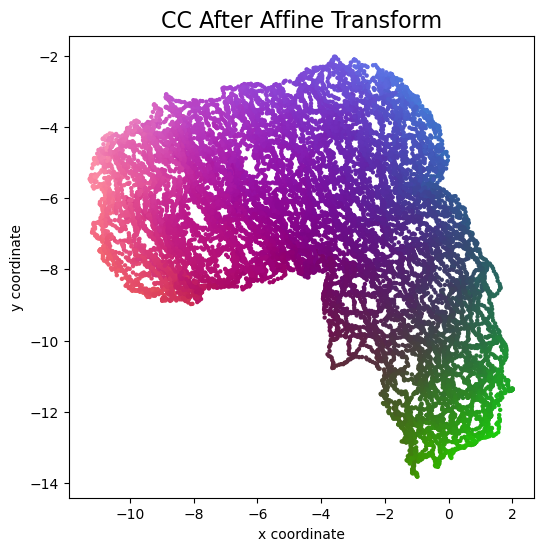

MAE: 0.3235
CEP: 0.2919


2024-12-03 11:09:36.674373: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 11:09:37.490113: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 11:09:38.768374: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 11:09:38.822947: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 11:10:08.563220: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


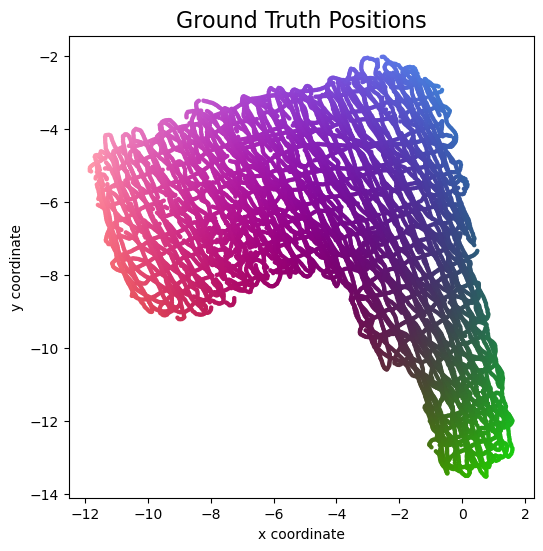

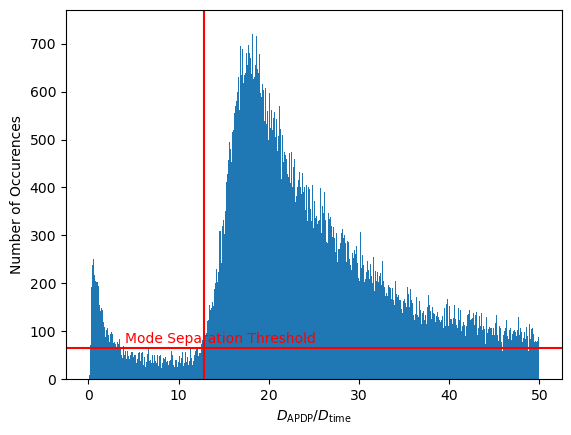

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733224355.734233  607129 service.cc:145] XLA service 0x79da2c195670 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733224355.734290  607129 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:12:35.867220: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:12:36.204614: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:12:37.170480: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:40 34ms/step - loss: 514.8704

I0000 00:00:1733224358.591617  607129 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 41.8579
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9976
TW: 0.9973
KS: 0.0724


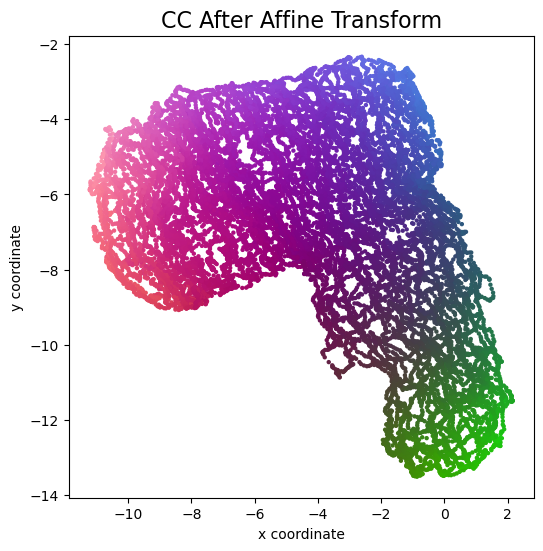

MAE: 0.3223
CEP: 0.2969


2024-12-03 11:14:55.362594: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 11:14:56.202778: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 11:14:57.553671: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 11:14:57.607869: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 11:15:28.699893: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


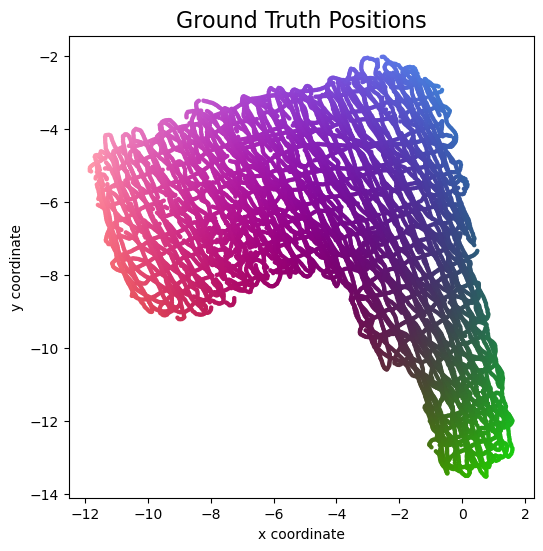

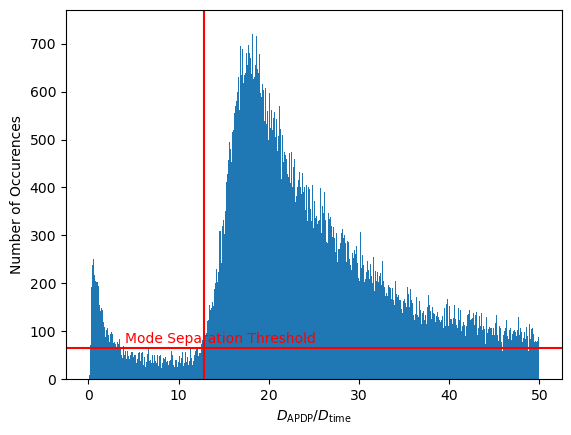

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733224679.591677  615467 service.cc:145] XLA service 0x79da381cf500 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733224679.591715  615467 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:17:59.705869: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:18:00.045225: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:18:00.996199: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:38 33ms/step - loss: 514.3827

I0000 00:00:1733224682.423320  615467 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 41.3592
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9975
TW: 0.9971
KS: 0.0783


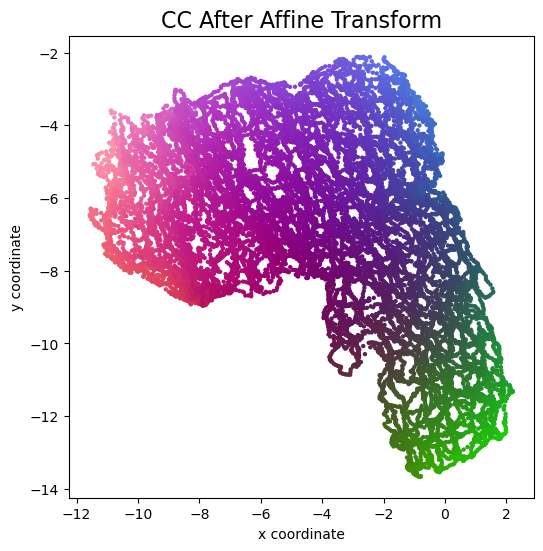

MAE: 0.3341
CEP: 0.3102


2024-12-03 11:20:19.568420: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 11:20:20.405735: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 11:20:21.810643: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 11:20:21.870352: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 11:20:59.805312: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


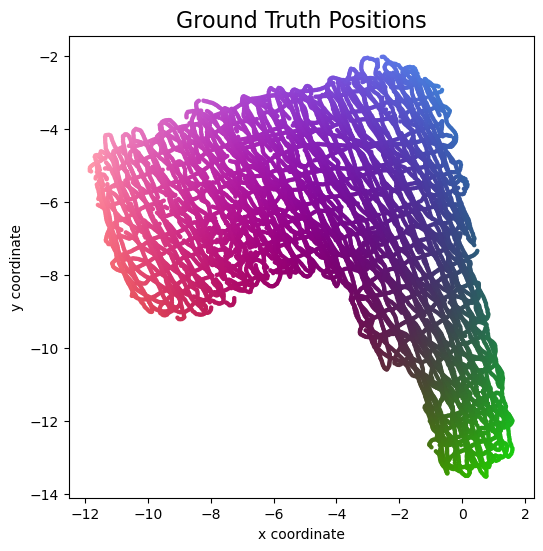

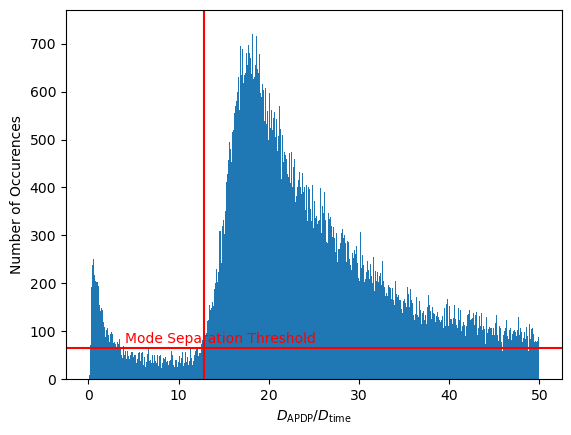

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733225006.970929  623823 service.cc:145] XLA service 0x79da480db930 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733225006.970985  623823 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:23:27.095244: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:23:27.424206: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:23:28.364072: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:38 33ms/step - loss: 516.1093

I0000 00:00:1733225009.784788  623823 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 41.2068
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9974
TW: 0.9973
KS: 0.0784


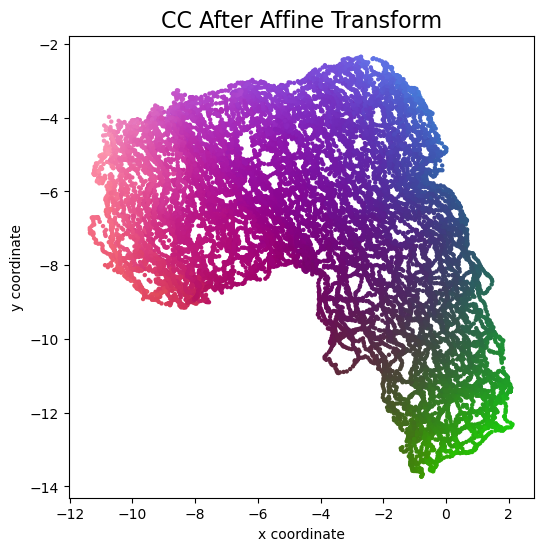

MAE: 0.3232
CEP: 0.2972


2024-12-03 11:25:46.961840: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 11:25:47.787472: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 11:25:49.051784: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 11:25:49.105452: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 11:26:20.524619: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


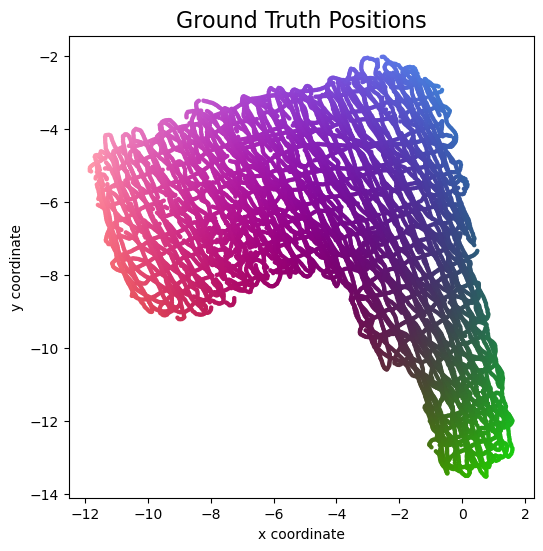

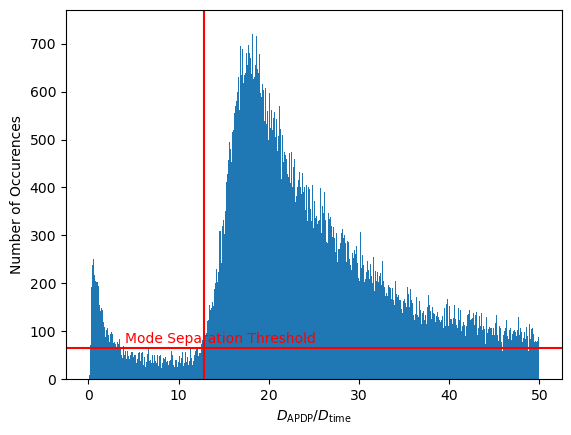

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733225328.873955  632161 service.cc:145] XLA service 0x79da18810f30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733225328.874000  632161 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:28:48.975973: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:28:49.306670: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:28:50.246477: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:38 33ms/step - loss: 513.0840

I0000 00:00:1733225331.671708  632161 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 46.3402
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9973
TW: 0.9970
KS: 0.0814


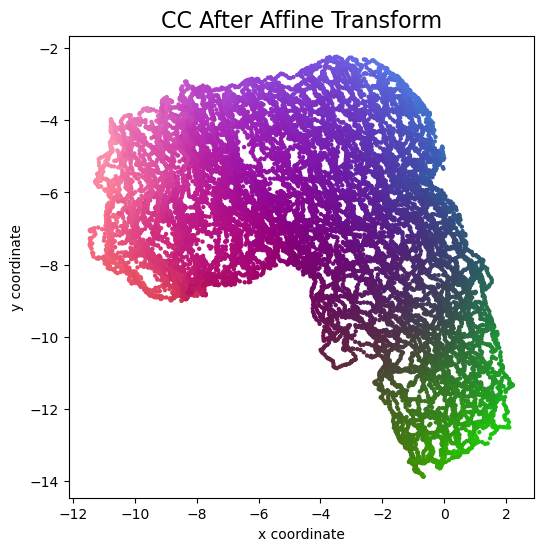

MAE: 0.3402
CEP: 0.3153


2024-12-03 11:31:08.760757: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 11:31:09.601355: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 11:31:10.933443: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 11:31:10.987035: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 11:31:42.498937: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


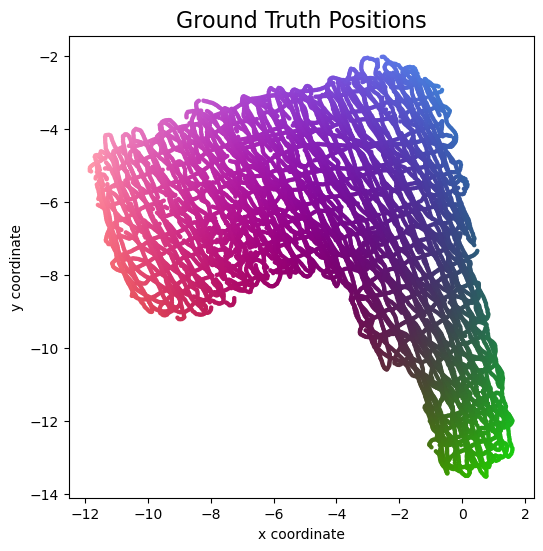

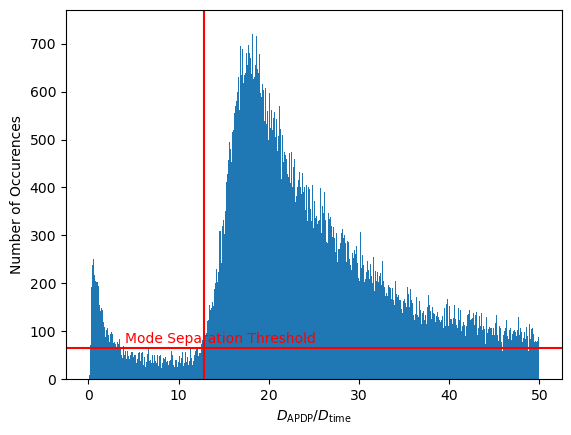

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733225650.983866  640538 service.cc:145] XLA service 0x79da44255240 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733225650.983909  640538 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:34:11.074580: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:34:11.411505: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:34:12.356136: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:39 33ms/step - loss: 514.2671

I0000 00:00:1733225653.783774  640538 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 43.6974
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9972
TW: 0.9967
KS: 0.0770


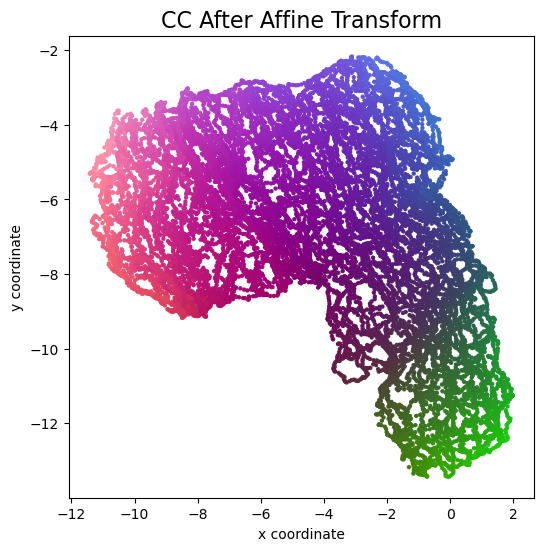

MAE: 0.3522
CEP: 0.3333


2024-12-03 11:36:30.739953: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 11:36:31.563850: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 11:36:32.870305: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 11:36:32.925333: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 11:37:04.547988: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


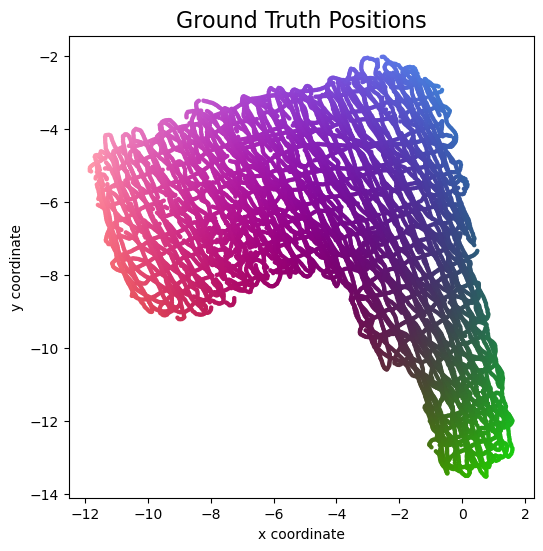

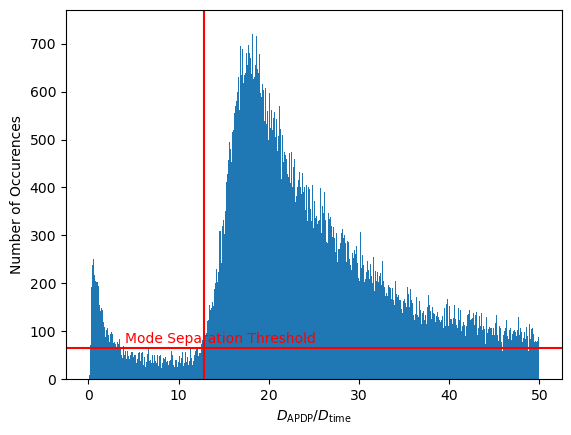

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733225986.028332  648868 service.cc:145] XLA service 0x79da1c029100 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733225986.028378  648868 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:39:46.154602: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:39:46.542671: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:39:47.488670: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:37 33ms/step - loss: 512.9986

I0000 00:00:1733225988.896811  648868 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 141s 45ms/step - loss: 40.4219
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9973
TW: 0.9972
KS: 0.0853


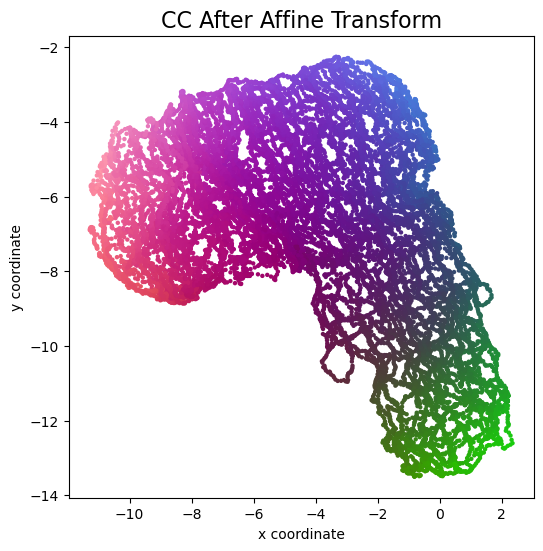

MAE: 0.3312
CEP: 0.3016


2024-12-03 11:42:10.203935: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-03 11:42:11.242905: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-12-03 11:42:12.884428: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-12-03 11:42:12.945804: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. 

Loading Dataset...


2024-12-03 11:42:48.491340: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


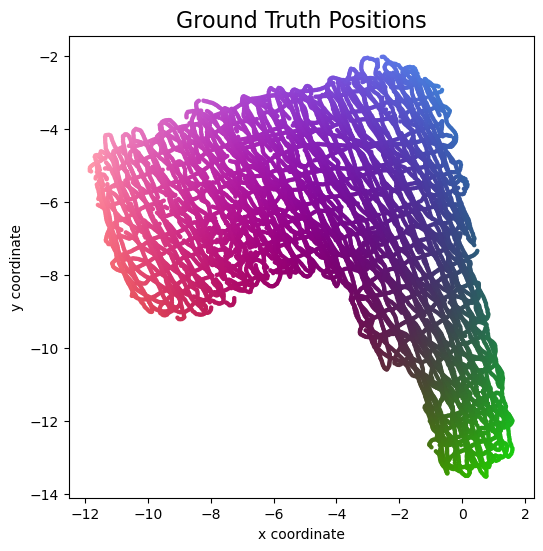

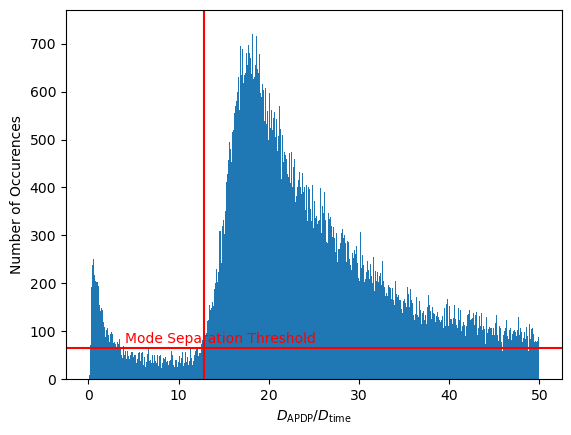

gamma =  12.816666603088379


  0%|          | 0/1 [00:00<?, ?it/s]

Generating dissimilarity realizations...


  0%|          | 0/1 [00:00<?, ?it/s]

Choosing smallest dissimilarity realization pair-wise...
Running shortest path algorithm...


Computing Shortest Paths:   0%|          | 0/834040000 [00:00<?, ?it/s]

Preparing Dijkstra Inputs:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/10 [00:00<?, ?it/s]

Determining longest short path...


Computing longest paths:   0%|          | 0/40000 [00:00<?, ?it/s]

Preparing tasks:   0%|          | 0/40000 [00:00<?, ?it/s]

Starting processes:   0%|          | 0/16 [00:00<?, ?it/s]

Longest short path has 77 hops


Pre-computing training paths:   0%|          | 0/3005 [00:00<?, ?it/s]

Preparing multiprocessing inputs:   0%|          | 0/3005 [00:00<?, ?it/s]

Starting Processes:   0%|          | 0/16 [00:00<?, ?it/s]

I0000 00:00:1733226316.312644  657500 service.cc:145] XLA service 0x79da3c289eb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733226316.312684  657500 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 4080, Compute Capability 8.9
2024-12-03 11:45:16.403346: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-12-03 11:45:16.734297: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
2024-12-03 11:45:17.680322: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:742] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility

   5/3000 ━━━━━━━━━━━━━━━━━━━━ 1:35 32ms/step - loss: 514.2365

I0000 00:00:1733226319.092257  657500 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 137s 44ms/step - loss: 42.0574
652/652 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
CT: 0.9975
TW: 0.9971
KS: 0.0685


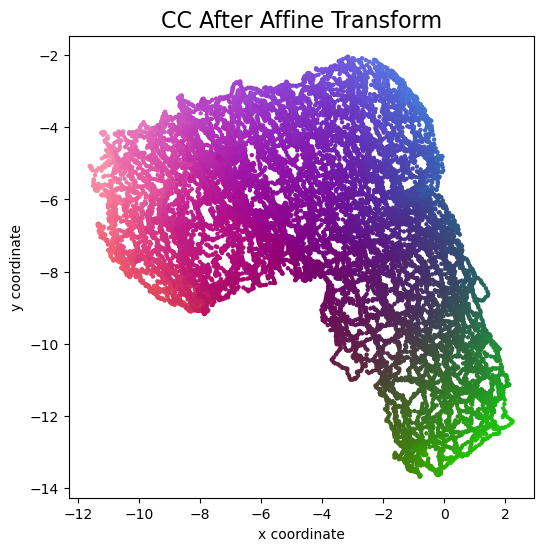

MAE: 0.3174
CEP: 0.2906


In [4]:
for i in range(20):
    p = mp.Process(target=objective_process, args=(result_queue,))
    p.start()
    p.join()

    mae, cep = result_queue.get()
    maes.append(mae)
    ceps.append(cep)

In [5]:
import matplotlib.pyplot as plt

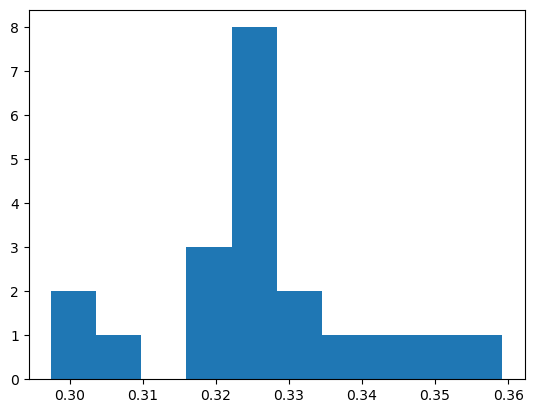

In [6]:
plt.hist(maes)
plt.show()

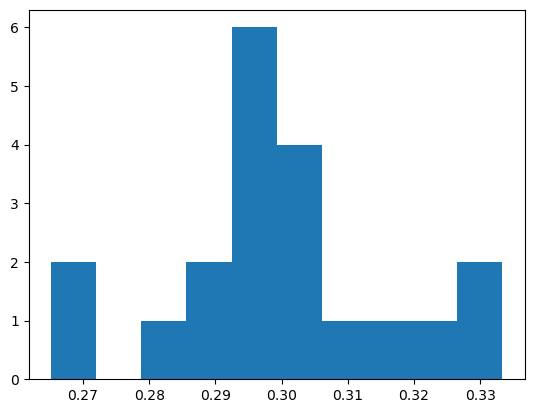

In [7]:
plt.hist(ceps)
plt.show()

In [8]:
print(f"Mean MAE: {np.mean(maes):.3f}")
print(f"Mean CEP: {np.mean(ceps):.3f}")

Mean MAE: 0.326
Mean CEP: 0.300
